In [ ]:
import numpy as np # linear algebra
import pandas as pd # data processing, CSV file I/O (e.g. pd.read_csv)


In [ ]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [ ]:
import os

# List files in the folder
folder_path = '/content/drive/MyDrive/Project'
files = os.listdir(folder_path)
print(files)

# Load a specific file
import pandas as pd
customers_data = pd.read_csv(os.path.join(folder_path, 'olist_customers_dataset.csv'))
geo_data = pd.read_csv(os.path.join(folder_path, 'olist_geolocation_dataset.csv'))


['olist_customers_dataset.csv', 'olist_geolocation_dataset.csv']


In [ ]:
geo_rep_data

,geolocation_zip_code_prefix,rep_lat,rep_long
0,1001,-23.550190,-46.634024
1,1002,-23.548146,-46.634979
2,1003,-23.548994,-46.635731
3,1004,-23.549799,-46.634757
4,1005,-23.549456,-46.636733
...,...,...,...
19010,99960,-27.953722,-52.025511
19011,99965,-28.183372,-52.039850
19012,99970,-28.343766,-51.874689
19013,99980,-28.389129,-51.843836


In [ ]:


# Make representative point data from zip code of geo_data
geo_rep_data = pd.DataFrame(dict(rep_lat=geo_data.groupby("geolocation_zip_code_prefix").geolocation_lat.mean(),
                                 rep_long=geo_data.groupby("geolocation_zip_code_prefix").geolocation_lng.mean())).reset_index()

# Merge geo_rep_data on customer data
geo_customers = customers_data.merge(geo_rep_data, left_on="customer_zip_code_prefix", right_on="geolocation_zip_code_prefix")

# Check how many rows were dropped
print("{} rows({:.1f}%) are missed.".format(len(customers_data)-len(geo_customers), (len(customers_data)-len(geo_customers))/len(geo_customers)*100))

# Display the merged dataframe
geo_customers.head()

278 rows(0.3%) are missed.


,customer_id,customer_unique_id,customer_zip_code_prefix,customer_city,customer_state,geolocation_zip_code_prefix,rep_lat,rep_long
0,06b8999e2fba1a1fbc88172c00ba8bc7,861eff4711a542e4b93843c6dd7febb0,14409,franca,SP,14409,-20.498489,-47.396929
1,5dca924cc99eea2dc5ba40d11ec5dd0f,2761fee7f378f0a8d7682d8a3fa07ab1,14409,franca,SP,14409,-20.498489,-47.396929
2,661897d4968f1b59bfff74c7eb2eb4fc,d06a495406b79cb8203ea21cc0942f8c,14409,franca,SP,14409,-20.498489,-47.396929
3,702b62324327ccba20f1be3465426437,8b3d988f330c1d1c3332ccd440c147b7,14409,franca,SP,14409,-20.498489,-47.396929
4,bdf997bae7ca819b0415f5174d6b4302,866755e25db620f8d7e81b351a15bb2f,14409,franca,SP,14409,-20.498489,-47.396929


In [ ]:
# Check which rows were dropped from customers_data
missing_data = customers_data[~customers_data.customer_zip_code_prefix.isin(geo_customers.customer_zip_code_prefix.values)]
missing_data

,customer_id,customer_unique_id,customer_zip_code_prefix,customer_city,customer_state
354,ecb1725b26e8b8c458181455dfa434ea,b55a113bb84fc10eaf58c6d09ec69794,72300,brasilia,DF
382,bcf86029aeed4ed8bac0e16eb14c22f5,7cd7974c9f79f75b77f323878ef87f43,11547,cubatao,SP
877,f4302056f0c58570522590f8181de2c7,67b05b597a66b5c449025000b9430abb,64605,picos,PI
1218,03bbe0ce5c28e05f22917607db798818,8f3dca4306d5a89e4ae2c65c110603a2,72465,brasilia,DF
1272,ad4950aded55c2ea376be59506456d68,aa2b96dd03307ea6dc4b763c0b5f0b39,7729,caieiras,SP
...,...,...,...,...,...
97467,cf818420383856a129134f5f8343f7b8,795c495a65f983b242fb01bd507977c5,72338,brasilia,DF
97780,67f3e907dce402e696b15f9308ff22ed,6f232f2f5c7f33b7bd9d794d2afacadd,68629,paragominas,PA
98140,f792e419335df11d82c32efcfb09c51b,c04c085b8e7573ba87b9ae1968d0985e,28530,sao sebastiao do paraiba,RJ
98878,78a11bb1fa72f556996b9a5b9bcd0629,e7536f62a200b415edd9491ac12a17fa,55863,siriji,PE


In [ ]:
# Check if really the zip codes were not in geo_data
geo_data.geolocation_zip_code_prefix.isin(missing_data.customer_zip_code_prefix.values)

,geolocation_zip_code_prefix
0,False
1,False
2,False
3,False
4,False
...,...
1000158,False
1000159,False
1000160,False
1000161,False


**At this moment, the missing volume is littele against geo_customers data volume so I ignore the data.<br>
After, consolidating sales data of each customer, I'd like to evaluate this judgement would be correct or not.**

In [ ]:
# Focus on customer_unique_id becouse customer_id is distributed per order
rev_geo_customers = geo_customers.groupby("customer_unique_id")[["rep_lat", "rep_long"]].mean().reset_index()
rev_geo_customers

,customer_unique_id,rep_lat,rep_long
0,0000366f3b9a7992bf8c76cfdf3221e2,-23.340235,-46.830140
1,0000b849f77a49e4a4ce2b2a4ca5be3f,-23.559115,-46.787626
2,0000f46a3911fa3c0805444483337064,-27.542880,-48.633426
3,0000f6ccb0745a6a4b88665a16c9f078,-1.312214,-48.483159
4,0004aac84e0df4da2b147fca70cf8255,-23.505548,-47.469705
...,...,...,...
95823,fffcf5a5ff07b0908bd4e2dbc735a684,-8.362511,-36.562343
95824,fffea47cd6d3cc0a88bd621562a9d061,-12.217395,-38.959308
95825,ffff371b4d645b6ecea244b27531430a,-11.834552,-55.508110
95826,ffff5962728ec6157033ef9805bacc48,-21.126568,-41.672806


In [ ]:
# Calculate time of mapping process
import time
start = time.perf_counter()

# Plot where the costomers are
import folium
from folium import Marker
from folium.plugins import MarkerCluster

# Create a base map
m_1 = folium.Map(location=[-15, -55], tiles="cartodbpositron", zoom_start=3)

# Add points which is randomly selected(n_samples=1,000) on the map
# Make a sample data
import random
sample_idx = random.sample(rev_geo_customers.index.to_list(), k=20000)
sample_df = rev_geo_customers.loc[sample_idx]

# Add points on the map
mc = MarkerCluster()
for idx, row in sample_df.iterrows():
    mc.add_child(Marker([row["rep_lat"], row["rep_long"]]))
m_1.add_child(mc)

# Add title to the map
title_html = '''
             <h3 align="center" style="font-size:20px"><b>Show Where Customer Is</b></h3>
             '''
m_1.get_root().html.add_child(folium.Element(title_html))

# Show the map
display(m_1)

# Print time of the process
print("The process consumes {:.2f} seconds.".format(time.perf_counter()-start))

The process consumes 15.77 seconds.


In [ ]:
# Look at sales against each order

# Get sales data
order_sales = pd.read_csv("/content/drive/MyDrive/Project/olist_order_items_dataset.csv")[["order_id", "order_item_id", "price"]]

# Get customer data against order
order_customers = pd.read_csv("/content/drive/MyDrive/Project/olist_orders_dataset.csv")[["order_id", "customer_id"]]

# Make customers sales data by oreder_sales and order_customer
customers_sales = pd.merge(order_sales, order_customers, on="order_id")

# Check how many rows are dropped
print("{}rows({:.1f})% are missed on customers_sales.".format(len(order_sales)-len(customers_sales), (len(order_sales)-len(customers_sales))/len(order_sales)*100))

# Add geodata
geo_customers_sales = pd.merge(customers_sales, geo_customers, on="customer_id")

# Check how many rows are dropped
print("{}rows({:.1f})% are missed on customers_sales.".format(len(customers_sales)-len(geo_customers_sales), (len(customers_sales)-len(geo_customers_sales))/len(customers_sales)*100))

geo_customers_sales

0rows(0.0)% are missed on customers_sales.
302rows(0.3)% are missed on customers_sales.


,order_id,order_item_id,price,customer_id,customer_unique_id,customer_zip_code_prefix,customer_city,customer_state,geolocation_zip_code_prefix,rep_lat,rep_long
0,00010242fe8c5a6d1ba2dd792cb16214,1,58.90,3ce436f183e68e07877b285a838db11a,871766c5855e863f6eccc05f988b23cb,28013,campos dos goytacazes,RJ,28013,-21.762775,-41.309633
1,00018f77f2f0320c557190d7a144bdd3,1,239.90,f6dd3ec061db4e3987629fe6b26e5cce,eb28e67c4c0b83846050ddfb8a35d051,15775,santa fe do sul,SP,15775,-20.220527,-50.903424
2,000229ec398224ef6ca0657da4fc703e,1,199.00,6489ae5e4333f3693df5ad4372dab6d3,3818d81c6709e39d06b2738a8d3a2474,35661,para de minas,MG,35661,-19.870305,-44.593326
3,00024acbcdf0a6daa1e931b038114c75,1,12.99,d4eb9395c8c0431ee92fce09860c5a06,af861d436cfc08b2c2ddefd0ba074622,12952,atibaia,SP,12952,-23.089925,-46.611654
4,00042b26cf59d7ce69dfabb4e55b4fd9,1,199.90,58dbd0b2d70206bf40e62cd34e84d795,64b576fb70d441e8f1b2d7d446e483c5,13226,varzea paulista,SP,13226,-23.243402,-46.827614
...,...,...,...,...,...,...,...,...,...,...,...
112343,fffc94f6ce00a00581880bf54a75a037,1,299.99,b51593916b4b8e0d6f66f2ae24f2673d,0c9aeda10a71f369396d0c04dce13a64,65077,sao luis,MA,65077,-2.497993,-44.297761
112344,fffcd46ef2263f404302a634eb57f7eb,1,350.00,84c5d4fbaf120aae381fad077416eaa0,0da9fe112eae0c74d3ba1fe16de0988b,81690,curitiba,PR,81690,-25.566904,-49.309115
112345,fffce4705a9662cd70adb13d4a31832d,1,99.90,29309aa813182aaddc9b259e31b870e6,cd79b407828f02fdbba457111c38e4c4,4039,sao paulo,SP,4039,-23.597794,-46.643923
112346,fffe18544ffabc95dfada21779c9644f,1,55.99,b5e6afd5a41800fdf401e0272ca74655,eb803377c9315b564bdedad672039306,13289,vinhedo,SP,13289,-23.040252,-46.979782


In [ ]:
# Check the sales value of the missing data against whole data
missing_data = customers_sales.loc[~customers_sales.customer_id.isin(geo_customers_sales.customer_id)]
print("{:.3f}% of sales value on customers_sales was missed.".format(missing_data.price.sum()/customers_sales.price.sum()))
missing_data

0.003% of sales value on customers_sales was missed.


,order_id,order_item_id,price,customer_id
241,009fa9bd0d92710e840793bfefa80867,1,84.99,ed19fa6ce948d52be769926c2baaa17c
799,01d3d4cb8c553d507dfd26fbd8b41e95,1,114.94,814dfd64a142fe2564faef3932b676b9
1032,02623e799dcc1e41066ddfe4af591f24,1,52.99,5ffea9b2ecf7eb23b4db0b1c4f76765d
1152,02acaa2a6f24e9c4e0bec7141b65f29b,1,29.90,198f8a1c41eaeb274fc8b25993320f18
1816,041cba819a99569f87996b65b73ea82e,1,23.99,98f405f18fec61e1a61037c344213e26
...,...,...,...,...
110420,fae78da81b7ad4a5389732f61e0264ef,3,18.90,90b17430567733d3e005cc92466c213a
110421,fae78da81b7ad4a5389732f61e0264ef,4,18.90,90b17430567733d3e005cc92466c213a
111537,fd5c73fb6edc88486582bf0a0bb989aa,1,199.99,c348e5bd22ca24a447a221536c71d8b3
112018,fe784ed3dfc728fd4de44fa9918fe1eb,1,39.90,534ae76adc5da4b4f9c7b505a756d59d


**At this stage, I can guss the missing data would cause no big impact even if I discard the data because sales value of the data is tiny against whole sales value.<br>
So, I'd like to decide to ignore the data.**

In [ ]:
# Check the data construction
geo_customers_sales.loc[geo_customers_sales.geolocation_zip_code_prefix == 28013]

,order_id,order_item_id,price,customer_id,customer_unique_id,customer_zip_code_prefix,customer_city,customer_state,geolocation_zip_code_prefix,rep_lat,rep_long
0,00010242fe8c5a6d1ba2dd792cb16214,1,58.90,3ce436f183e68e07877b285a838db11a,871766c5855e863f6eccc05f988b23cb,28013,campos dos goytacazes,RJ,28013,-21.762775,-41.309633
27467,3ea310e0ca8eaa2d771f9ae489e6535e,1,145.00,ee55320c214a7ac7be7f488c6a63da0d,1256191557354bf29497a6f8ea3be86d,28013,campos dos goytacazes,RJ,28013,-21.762775,-41.309633
29724,43c564b825003473af9a68138631d388,1,75.35,7a9e4631c3fa2487b3a4d1a9becf3701,0e3c753956e35026b965d9ac3590c5af,28013,campos dos goytacazes,RJ,28013,-21.762775,-41.309633
34405,4e0158c628911a5f52cfbc38242c0d08,1,19.90,c7858f425c53bf289b58bbca491fdfb6,e19295fe39010feeca6ef77ac61275d9,28013,campos dos goytacazes,RJ,28013,-21.762775,-41.309633
36814,53d1f26612893ef17dbc27d69a8382e4,1,129.50,2622cbd2edf907bb373c679b09c01c01,2583866968d72b2503e08837f6698689,28013,campos dos goytacazes,RJ,28013,-21.762775,-41.309633
40560,5c94ad4e194c0e6794688a9d2b9ea94b,1,29.90,ad6acb9e0ffc35906b64d488bbdb6d5a,ca50300f552f1bc9b5aa898a29382d69,28013,campos dos goytacazes,RJ,28013,-21.762775,-41.309633
79827,b61a2f7167a516d76088020bc63b4f7b,1,200.00,e625d447d6605488f6e7b8bba3024e08,0e3c753956e35026b965d9ac3590c5af,28013,campos dos goytacazes,RJ,28013,-21.762775,-41.309633
82223,bb4eb0196897c20281a61f75ce23211c,1,96.00,c7d65abc07da65a413738fc854d8112a,81fde78227bbac716944e215b6895639,28013,campos dos goytacazes,RJ,28013,-21.762775,-41.309633
83062,bd31b009e1dbc47fc7c250b1e2cf5440,1,52.90,2c23918ee23c1406b9cb5f78d4b2062a,8d500d527a1d67efec12faf28b61885b,28013,campos dos goytacazes,RJ,28013,-21.762775,-41.309633
98385,dfbae856658ed0da74731056554e1b77,1,61.90,6293c0e2de01a0b4c70dd59ed6f3a05a,8f3dfd04811555a6f7f350e1389c0394,28013,campos dos goytacazes,RJ,28013,-21.762775,-41.309633


In [ ]:
# Check total number of unique "order_id" and "customer_id" are equal
print(len(geo_customers_sales.order_id.unique()))
print(len(geo_customers_sales.customer_id.unique()))

98392
98392


In [ ]:
# Make data frame for Purchase Price data

# Price is distributed per row (item in order) so the data should be summed per order
purchase_price_df_price = geo_customers_sales.groupby("customer_id")["price"].sum().reset_index()
# Rename summed price data as total_spending for avoiding confuse
purchase_price_df_price = purchase_price_df_price.rename(columns={"price": "purchase_price"})
# Geo data should be same per row so the data should be meaned
purchase_price_df_geo = geo_customers_sales.groupby("customer_id")[["rep_lat", "rep_long"]].mean().reset_index()
# Assemble above two data
purchase_price_df = pd.merge(purchase_price_df_price, purchase_price_df_geo, on="customer_id")
purchase_price_df

,customer_id,purchase_price,rep_lat,rep_long
0,00012a2ce6f8dcda20d059ce98491703,89.80,-23.499063,-46.767939
1,000161a058600d5901f007fab4c27140,54.90,-20.469754,-45.123242
2,0001fd6190edaaf884bcaf3d49edf079,179.99,-18.706581,-40.406384
3,0002414f95344307404f0ace7a26f1d5,149.90,-21.770599,-43.355230
4,000379cdec625522490c315e70c7a9fb,93.00,-23.738709,-46.689333
...,...,...,...,...
98387,fffcb937e9dd47a13f05ecb8290f4d3e,78.00,-23.686344,-46.745879
98388,fffecc9f79fd8c764f843e9951b11341,54.90,-29.631686,-50.834574
98389,fffeda5b6d849fbd39689bb92087f431,47.90,-22.961345,-43.213641
98390,ffff42319e9b2d713724ae527742af25,199.90,-23.606135,-46.757486


In [ ]:
# Check distribution of price on above data
purchase_price_df.purchase_price.describe()

,purchase_price
count,98392.000000
mean,137.753676
std,210.695389
min,0.850000
25%,45.900000
50%,86.900000
75%,149.900000
max,13440.000000


In [ ]:
# Look at purchase price distribution by bubble map
import numpy as np
# Calculate tume of the process
start =time.perf_counter()

# Create a base map
m_2 = folium.Map(location=[-15, -55], tiles="cartodbpositron", zoom_start=3)

# Make color palette
import matplotlib.pyplot as plt
import matplotlib.pyplot as plt
from matplotlib.colors import rgb2hex

def make_palette(n_samples, cmap):
    n_samples = n_samples
    color_map = plt.get_cmap(cmap)
    palette = []
    for c in np.linspace(0.0, 1.0, n_samples*2):
        color_code = rgb2hex(color_map(c))
        palette.append(color_code)
    return palette[n_samples:]

# Make color producer function
def color_producer(val):
    if val <= 45.9:
        return make_palette(2, "Blues")[0]
    if val <= 86.9:
        return make_palette(2, "Blues")[1]
    if val <= 137.8:
        return make_palette(1, "Wistia")[0]
    if val <= 149.9:
        return make_palette(2, "Reds")[0]
    else:
        return make_palette(2, "Reds")[1]

# Add points which is randomly selected(n_samples=1,000) on the map
# Make a sample data
import random
sample_idx = random.sample(purchase_price_df.index.to_list(), k=1000)
sample_df = purchase_price_df.loc[sample_idx]

# Add bubble map to base map
from folium import Circle

for i in range(0, len(sample_df)):
    Circle(
        location=[sample_df.iloc[i]["rep_lat"], sample_df.iloc[i]["rep_long"]],
        radius=sample_df.iloc[i]["purchase_price"],
        color=color_producer(sample_df.iloc[i]["purchase_price"]),
        popup=sample_df.iloc[i]["purchase_price"]
    ).add_to(m_2)

# Make function for add categorical legend
def add_categorical_legend(folium_map, title, colors, labels):
    if len(colors) != len(labels):
        raise ValueError("colors and labels must have the same length.")
    color_by_label = dict(zip(labels, colors))
    legend_categories = ""
    for label, color in color_by_label.items():
        legend_categories += f"<li><span style='background:{color}'></span>{label}</li>"
    legend_html = f"""
    <div id='maplegend' class='maplegend'>
      <div class='legend-title'>{title}</div>
      <div class='legend-scale'>
        <ul class='legend-labels'>
        {legend_categories}
        </ul>
      </div>
    </div>
    """
    script = f"""
        <script type="text/javascript">
        var oneTimeExecution = (function() {{
                    var executed = false;
                    return function() {{
                        if (!executed) {{
                             var checkExist = setInterval(function() {{
                                       if ((document.getElementsByClassName('leaflet-top leaflet-right').length) || (!executed)) {{
                                          document.getElementsByClassName('leaflet-top leaflet-right')[0].style.display = "flex"
                                          document.getElementsByClassName('leaflet-top leaflet-right')[0].style.flexDirection = "column"
                                          document.getElementsByClassName('leaflet-top leaflet-right')[0].innerHTML += `{legend_html}`;
                                          clearInterval(checkExist);
                                          executed = true;
                                       }}
                                    }}, 100);
                        }}
                    }};
                }})();
        oneTimeExecution()
        </script>
      """
    css = """
    <style type='text/css'>
      .maplegend {
        z-index:9999;
        float:right;
        background-color: rgba(255, 255, 255, 1);
        border-radius: 5px;
        border: 2px solid #bbb;
        padding: 10px;
        font-size:12px;
        positon: relative;
      }
      .maplegend .legend-title {
        text-align: left;
        margin-bottom: 5px;
        font-weight: bold;
        font-size: 90%;
        }
      .maplegend .legend-scale ul {
        margin: 0;
        margin-bottom: 5px;
        padding: 0;
        float: left;
        list-style: none;
        }
      .maplegend .legend-scale ul li {
        font-size: 80%;
        list-style: none;
        margin-left: 0;
        line-height: 18px;
        margin-bottom: 2px;
        }
      .maplegend ul.legend-labels li span {
        display: block;
        float: left;
        height: 16px;
        width: 30px;
        margin-right: 5px;
        margin-left: 0;
        border: 0px solid #ccc;
        }
      .maplegend .legend-source {
        font-size: 80%;
        color: #777;
        clear: both;
        }
      .maplegend a {
        color: #777;
        }
    </style>
    """
    folium_map.get_root().header.add_child(folium.Element(script + css))
    return folium_map

# Add categorical legend on the map
# Make color_df
color_df = pd.DataFrame(dict(purchase_price=["Very Low(<= 45.9 (25% point))", "Low(<= 86.9 (50% point))", "Middle(<= 137.8 (mean))", "High(<= 149.9(75% point))", "Very High(> 149.9)"],
                            color=[make_palette(2, "Blues")[0], make_palette(2, "Blues")[1], make_palette(1, "Wistia")[0], make_palette(2, "Reds")[0], make_palette(2, "Reds")[1]]))

m_2 = add_categorical_legend(m_2, 'purchase_price',
                             colors = color_df.color.values.tolist(),
                           labels = color_df.purchase_price.values.tolist())

# Add title to the map
title_html = '''
             <h3 align="center" style="font-size:20px"><b>Show Purchase Price<br>(n_samples=1,000)</b></h3>
             '''
m_2.get_root().html.add_child(folium.Element(title_html))

# Display the map
display(m_2)

# Check the time
print("The process consumes {:.2f} seconds.".format(time.perf_counter()-start))

The process consumes 3.13 seconds.


In [ ]:
# Look at sold product categories on map

# Load products data
products_data = pd.read_csv("/content/drive/MyDrive/Project/olist_products_dataset.csv")

# Change product category name into English
english_product_category = pd.read_csv("/content/drive/MyDrive/Project/product_category_name_translation.csv")
products_data = products_data.merge(english_product_category, on="product_category_name", how="left")
print("{}rows({:.2f}%) are not matched on products_data.".format(products_data.product_category_name_english.isnull().sum(), products_data.product_category_name_english.isnull().sum()/len(products_data)*100))
products_data

623rows(1.89%) are not matched on products_data.


,product_id,product_category_name,product_name_lenght,product_description_lenght,product_photos_qty,product_weight_g,product_length_cm,product_height_cm,product_width_cm,product_category_name_english
0,1e9e8ef04dbcff4541ed26657ea517e5,perfumaria,40.0,287.0,1.0,225.0,16.0,10.0,14.0,perfumery
1,3aa071139cb16b67ca9e5dea641aaa2f,artes,44.0,276.0,1.0,1000.0,30.0,18.0,20.0,art
2,96bd76ec8810374ed1b65e291975717f,esporte_lazer,46.0,250.0,1.0,154.0,18.0,9.0,15.0,sports_leisure
3,cef67bcfe19066a932b7673e239eb23d,bebes,27.0,261.0,1.0,371.0,26.0,4.0,26.0,baby
4,9dc1a7de274444849c219cff195d0b71,utilidades_domesticas,37.0,402.0,4.0,625.0,20.0,17.0,13.0,housewares
...,...,...,...,...,...,...,...,...,...,...
32946,a0b7d5a992ccda646f2d34e418fff5a0,moveis_decoracao,45.0,67.0,2.0,12300.0,40.0,40.0,40.0,furniture_decor
32947,bf4538d88321d0fd4412a93c974510e6,construcao_ferramentas_iluminacao,41.0,971.0,1.0,1700.0,16.0,19.0,16.0,construction_tools_lights
32948,9a7c6041fa9592d9d9ef6cfe62a71f8c,cama_mesa_banho,50.0,799.0,1.0,1400.0,27.0,7.0,27.0,bed_bath_table
32949,83808703fc0706a22e264b9d75f04a2e,informatica_acessorios,60.0,156.0,2.0,700.0,31.0,13.0,20.0,computers_accessories


In [ ]:
# Check rows which inclued nan on the data
products_data.loc[products_data.product_category_name_english.isnull() == True]

,product_id,product_category_name,product_name_lenght,product_description_lenght,product_photos_qty,product_weight_g,product_length_cm,product_height_cm,product_width_cm,product_category_name_english
105,a41e356c76fab66334f36de622ecbd3a,NaN,NaN,NaN,NaN,650.0,17.0,14.0,12.0,NaN
128,d8dee61c2034d6d075997acef1870e9b,NaN,NaN,NaN,NaN,300.0,16.0,7.0,20.0,NaN
145,56139431d72cd51f19eb9f7dae4d1617,NaN,NaN,NaN,NaN,200.0,20.0,20.0,20.0,NaN
154,46b48281eb6d663ced748f324108c733,NaN,NaN,NaN,NaN,18500.0,41.0,30.0,41.0,NaN
197,5fb61f482620cb672f5e586bb132eae9,NaN,NaN,NaN,NaN,300.0,35.0,7.0,12.0,NaN
...,...,...,...,...,...,...,...,...,...,...
32515,b0a0c5dd78e644373b199380612c350a,NaN,NaN,NaN,NaN,1800.0,30.0,20.0,70.0,NaN
32589,10dbe0fbaa2c505123c17fdc34a63c56,NaN,NaN,NaN,NaN,800.0,30.0,10.0,23.0,NaN
32616,bd2ada37b58ae94cc838b9c0569fecd8,NaN,NaN,NaN,NaN,200.0,21.0,8.0,16.0,NaN
32772,fa51e914046aab32764c41356b9d4ea4,NaN,NaN,NaN,NaN,1300.0,45.0,16.0,45.0,NaN


In [ ]:
# Check numbers of nan on product_category_name in original data
pd.read_csv("/content/drive/MyDrive/Project/olist_products_dataset.csv").product_category_name.isnull().sum()

610

In [ ]:
# Drop invalid data
rev_products = products_data.dropna(subset=["product_category_name_english"])
rev_products = rev_products.drop("product_category_name", axis=1)
print("{}rows({:.2f}%) are missed on rev_products.".format(len(products_data)-len(rev_products), (len(products_data)-len(rev_products))/len(products_data)*100))
rev_products

623rows(1.89%) are missed on rev_products.


,product_id,product_name_lenght,product_description_lenght,product_photos_qty,product_weight_g,product_length_cm,product_height_cm,product_width_cm,product_category_name_english
0,1e9e8ef04dbcff4541ed26657ea517e5,40.0,287.0,1.0,225.0,16.0,10.0,14.0,perfumery
1,3aa071139cb16b67ca9e5dea641aaa2f,44.0,276.0,1.0,1000.0,30.0,18.0,20.0,art
2,96bd76ec8810374ed1b65e291975717f,46.0,250.0,1.0,154.0,18.0,9.0,15.0,sports_leisure
3,cef67bcfe19066a932b7673e239eb23d,27.0,261.0,1.0,371.0,26.0,4.0,26.0,baby
4,9dc1a7de274444849c219cff195d0b71,37.0,402.0,4.0,625.0,20.0,17.0,13.0,housewares
...,...,...,...,...,...,...,...,...,...
32946,a0b7d5a992ccda646f2d34e418fff5a0,45.0,67.0,2.0,12300.0,40.0,40.0,40.0,furniture_decor
32947,bf4538d88321d0fd4412a93c974510e6,41.0,971.0,1.0,1700.0,16.0,19.0,16.0,construction_tools_lights
32948,9a7c6041fa9592d9d9ef6cfe62a71f8c,50.0,799.0,1.0,1400.0,27.0,7.0,27.0,bed_bath_table
32949,83808703fc0706a22e264b9d75f04a2e,60.0,156.0,2.0,700.0,31.0,13.0,20.0,computers_accessories


In [ ]:
# Assemble the data with order items dataset

# Load order items dataset
order_items = pd.read_csv("/content/drive/MyDrive/Project/olist_order_items_dataset.csv")

# Merge the two data
order_products = order_items.merge(rev_products, on="product_id")
print("{}rows({:.2f}%) are missed on order_items.".format(len(order_items)-len(order_products), (len(order_items)-len(order_products))/len(order_items)*100))
order_products

1627rows(1.44%) are missed on order_items.


,order_id,order_item_id,product_id,seller_id,shipping_limit_date,price,freight_value,product_name_lenght,product_description_lenght,product_photos_qty,product_weight_g,product_length_cm,product_height_cm,product_width_cm,product_category_name_english
0,00010242fe8c5a6d1ba2dd792cb16214,1,4244733e06e7ecb4970a6e2683c13e61,48436dade18ac8b2bce089ec2a041202,2017-09-19 09:45:35,58.9,13.29,58.0,598.0,4.0,650.0,28.0,9.0,14.0,cool_stuff
1,130898c0987d1801452a8ed92a670612,1,4244733e06e7ecb4970a6e2683c13e61,48436dade18ac8b2bce089ec2a041202,2017-07-05 02:44:11,55.9,17.96,58.0,598.0,4.0,650.0,28.0,9.0,14.0,cool_stuff
2,532ed5e14e24ae1f0d735b91524b98b9,1,4244733e06e7ecb4970a6e2683c13e61,48436dade18ac8b2bce089ec2a041202,2018-05-23 10:56:25,64.9,18.33,58.0,598.0,4.0,650.0,28.0,9.0,14.0,cool_stuff
3,6f8c31653edb8c83e1a739408b5ff750,1,4244733e06e7ecb4970a6e2683c13e61,48436dade18ac8b2bce089ec2a041202,2017-08-07 18:55:08,58.9,16.17,58.0,598.0,4.0,650.0,28.0,9.0,14.0,cool_stuff
4,7d19f4ef4d04461989632411b7e588b9,1,4244733e06e7ecb4970a6e2683c13e61,48436dade18ac8b2bce089ec2a041202,2017-08-16 22:05:11,58.9,13.29,58.0,598.0,4.0,650.0,28.0,9.0,14.0,cool_stuff
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
111018,ffebd80e3291e811c308365936897efd,1,4cc4d02efc8f249c13355147fb44e34d,d1c7fa84e48cfa21a0e595167c1c500e,2018-07-18 20:23:55,129.9,51.20,37.0,653.0,1.0,6700.0,35.0,12.0,22.0,garden_tools
111019,ffee31fb4b5e35c9123608015637c495,1,b10ecf8e33aaaea419a9fa860ea80fb5,0241d4d5d36f10f80c644447315af0bd,2018-08-21 10:10:11,99.0,13.52,30.0,308.0,1.0,2300.0,37.0,30.0,20.0,furniture_decor
111020,fff7c4452f050315db1b3f24d9df5fcd,1,dd469c03ad67e201bc2179ef077dcd48,7e93a43ef30c4f03f38b393420bc753a,2017-06-07 17:05:23,736.0,20.91,33.0,658.0,3.0,400.0,19.0,9.0,15.0,watches_gifts
111021,fffa82886406ccf10c7b4e35c4ff2788,1,bbe7651fef80287a816ead73f065fc4b,8f2ce03f928b567e3d56181ae20ae952,2017-12-22 17:31:42,229.9,44.02,32.0,280.0,2.0,2700.0,60.0,15.0,15.0,sports_leisure


In [ ]:
# Assemble the data with geo_customers_sales

# Drop unnessesary columns
order_sales = order_products[["order_id", "order_item_id", "product_id", "product_category_name_english"]]

# Merge the data with geo_customers_sales
products_sales = order_sales.merge(geo_customers_sales, on=["order_id", "order_item_id"], how="left")
print("{}rows({:.2f}%) are not matched on products_data.".format(products_sales.customer_id.isnull().sum(), products_sales.customer_id.isnull().sum()/len(products_sales)*100))
products_sales

296rows(0.27%) are not matched on products_data.


,order_id,order_item_id,product_id,product_category_name_english,price,customer_id,customer_unique_id,customer_zip_code_prefix,customer_city,customer_state,geolocation_zip_code_prefix,rep_lat,rep_long
0,00010242fe8c5a6d1ba2dd792cb16214,1,4244733e06e7ecb4970a6e2683c13e61,cool_stuff,58.9,3ce436f183e68e07877b285a838db11a,871766c5855e863f6eccc05f988b23cb,28013.0,campos dos goytacazes,RJ,28013.0,-21.762775,-41.309633
1,130898c0987d1801452a8ed92a670612,1,4244733e06e7ecb4970a6e2683c13e61,cool_stuff,55.9,e6eecc5a77de221464d1c4eaff0a9b64,0fb8e3eab2d3e79d92bb3fffbb97f188,75800.0,jatai,GO,75800.0,-17.884337,-51.716990
2,532ed5e14e24ae1f0d735b91524b98b9,1,4244733e06e7ecb4970a6e2683c13e61,cool_stuff,64.9,4ef55bf80f711b372afebcb7c715344a,3419052c8c6b45daf79c1e426f9e9bcb,30720.0,belo horizonte,MG,30720.0,-19.914323,-43.975703
3,6f8c31653edb8c83e1a739408b5ff750,1,4244733e06e7ecb4970a6e2683c13e61,cool_stuff,58.9,30407a72ad8b3f4df4d15369126b20c9,e7c828d22c0682c1565252deefbe334d,83070.0,sao jose dos pinhais,PR,83070.0,-25.520220,-49.125033
4,7d19f4ef4d04461989632411b7e588b9,1,4244733e06e7ecb4970a6e2683c13e61,cool_stuff,58.9,91a792fef70ecd8cc69d3c7feb3d12da,0bb98ba72dcc08e95f9d8cc434e9a2cc,36400.0,conselheiro lafaiete,MG,36400.0,-20.655804,-43.777859
...,...,...,...,...,...,...,...,...,...,...,...,...,...
111018,ffebd80e3291e811c308365936897efd,1,4cc4d02efc8f249c13355147fb44e34d,garden_tools,129.9,050309b91cc5e04e68841938e7984aaf,a1c2e4b4c1b29e41684ebdf3cc6538f8,28740.0,conceicao de macabu,RJ,28740.0,-22.088071,-41.867321
111019,ffee31fb4b5e35c9123608015637c495,1,b10ecf8e33aaaea419a9fa860ea80fb5,furniture_decor,99.0,11e0f43ab4e2d2c48348dd9332c0ef80,4e15fee963523774998876e3624952f4,83065.0,sao jose dos pinhais,PR,83065.0,-25.511002,-49.161739
111020,fff7c4452f050315db1b3f24d9df5fcd,1,dd469c03ad67e201bc2179ef077dcd48,watches_gifts,736.0,dec8952e97ef6124259c56914fb3569c,c86ab5ff2bac777c4e770a383feca4eb,27261.0,volta redonda,RJ,27261.0,-22.524331,-44.102125
111021,fffa82886406ccf10c7b4e35c4ff2788,1,bbe7651fef80287a816ead73f065fc4b,sports_leisure,229.9,a5201e1a6d71a8d21e869151bd5b4085,2a3ab9bf9639491997586882c502540a,59955.0,tenente ananias,RN,59955.0,-6.464289,-38.180078


In [ ]:
# Check nan data on customer_id
products_sales.loc[products_sales.customer_id.isnull()].groupby("product_category_name_english").count()["order_id"].sort_values(ascending=False)

,order_id
product_category_name_english,
health_beauty,29
bed_bath_table,28
computers_accessories,26
watches_gifts,23
furniture_decor,18
sports_leisure,17
perfumery,15
telephony,13
toys,12


In [ ]:
# Drop nan rows on customer_id
products_sales = products_sales.dropna(subset=["customer_id"])
products_sales

,order_id,order_item_id,product_id,product_category_name_english,price,customer_id,customer_unique_id,customer_zip_code_prefix,customer_city,customer_state,geolocation_zip_code_prefix,rep_lat,rep_long
0,00010242fe8c5a6d1ba2dd792cb16214,1,4244733e06e7ecb4970a6e2683c13e61,cool_stuff,58.9,3ce436f183e68e07877b285a838db11a,871766c5855e863f6eccc05f988b23cb,28013.0,campos dos goytacazes,RJ,28013.0,-21.762775,-41.309633
1,130898c0987d1801452a8ed92a670612,1,4244733e06e7ecb4970a6e2683c13e61,cool_stuff,55.9,e6eecc5a77de221464d1c4eaff0a9b64,0fb8e3eab2d3e79d92bb3fffbb97f188,75800.0,jatai,GO,75800.0,-17.884337,-51.716990
2,532ed5e14e24ae1f0d735b91524b98b9,1,4244733e06e7ecb4970a6e2683c13e61,cool_stuff,64.9,4ef55bf80f711b372afebcb7c715344a,3419052c8c6b45daf79c1e426f9e9bcb,30720.0,belo horizonte,MG,30720.0,-19.914323,-43.975703
3,6f8c31653edb8c83e1a739408b5ff750,1,4244733e06e7ecb4970a6e2683c13e61,cool_stuff,58.9,30407a72ad8b3f4df4d15369126b20c9,e7c828d22c0682c1565252deefbe334d,83070.0,sao jose dos pinhais,PR,83070.0,-25.520220,-49.125033
4,7d19f4ef4d04461989632411b7e588b9,1,4244733e06e7ecb4970a6e2683c13e61,cool_stuff,58.9,91a792fef70ecd8cc69d3c7feb3d12da,0bb98ba72dcc08e95f9d8cc434e9a2cc,36400.0,conselheiro lafaiete,MG,36400.0,-20.655804,-43.777859
...,...,...,...,...,...,...,...,...,...,...,...,...,...
111018,ffebd80e3291e811c308365936897efd,1,4cc4d02efc8f249c13355147fb44e34d,garden_tools,129.9,050309b91cc5e04e68841938e7984aaf,a1c2e4b4c1b29e41684ebdf3cc6538f8,28740.0,conceicao de macabu,RJ,28740.0,-22.088071,-41.867321
111019,ffee31fb4b5e35c9123608015637c495,1,b10ecf8e33aaaea419a9fa860ea80fb5,furniture_decor,99.0,11e0f43ab4e2d2c48348dd9332c0ef80,4e15fee963523774998876e3624952f4,83065.0,sao jose dos pinhais,PR,83065.0,-25.511002,-49.161739
111020,fff7c4452f050315db1b3f24d9df5fcd,1,dd469c03ad67e201bc2179ef077dcd48,watches_gifts,736.0,dec8952e97ef6124259c56914fb3569c,c86ab5ff2bac777c4e770a383feca4eb,27261.0,volta redonda,RJ,27261.0,-22.524331,-44.102125
111021,fffa82886406ccf10c7b4e35c4ff2788,1,bbe7651fef80287a816ead73f065fc4b,sports_leisure,229.9,a5201e1a6d71a8d21e869151bd5b4085,2a3ab9bf9639491997586882c502540a,59955.0,tenente ananias,RN,59955.0,-6.464289,-38.180078


In [ ]:
# Look at category name on bubble map

# Check unique values of category name for coloring
len(products_sales.product_category_name_english.unique())

71

In [ ]:
# Squeeze categories into big categories

# Make list of category names
category_df = pd.DataFrame(dict(product_category_name_english=products_sales.product_category_name_english.unique()))
category_df

,product_category_name_english
0,cool_stuff
1,pet_shop
2,furniture_decor
3,perfumery
4,garden_tools
...,...
66,costruction_tools_tools
67,fashion_sport
68,la_cuisine
69,security_and_services


**I categorize above categories into big categories as below.<br>
(index)[0, 15, 47, 48, 68] are in "Food_and_Beverage" (category).<br>
[1] is in "Pet".<br>
[2, 10, 13, 29, 31, 49, 59, 60, 64] are in "Furniture".<br>
[3, 5, 7, 24] are in "Daily_Necessity".<br>
[4, 16, 38, 53] are in "Gardening".<br>
[6, 12, 17, 18, 20, 28, 30, 32, 33, 35, 37, 54, 56, 61, 62, 65, 69] are in "Electric_Appliance".<br>
[8, 41, 57] are in "Book".<br>
[9, 11, 14, 45, 46, 52, 55, 67, 70] are "Fashion".<br>
[19, 22, 40, 43, 66] are "DIY".<br>
[21, 23, 34, 42, 58]are in "Baby_and_Kids".<br>
[25, 50] are "Industry_and_Business".<br>
[26] is "Watch".<br>
[27] is "Auto".<br>
[36, 51] are "Music".<br>
[39, 44, 63] are "Art".**

In [ ]:
big_category_dict = dict(Food_and_Beverage=[0, 15, 47, 48, 68],
                    Pet=[1],
                    Furniture=[2, 10, 13, 29, 31, 49, 59, 60, 64],
                    Daily_Necessity=[3, 5, 7, 24],
                    Gardening=[4, 16, 38, 53],
                    Electric_Appliance=[6, 12, 17, 18, 20, 28, 30, 32, 33, 35, 37, 54, 56, 61, 62, 65, 69],
                    Book=[8, 41, 57],
                    Fashion=[9, 11, 14, 45, 46, 52, 55, 67], # Removed 70 as it is out of bounds
                    DIY=[19, 22, 40, 43, 66],
                    Baby_and_Kids=[21, 23, 34, 42, 58],
                    Industry_and_Business=[25, 50],
                    Watch=[26],
                    Auto=[27],
                    Music=[36, 51],
                    Art=[39, 44, 63]
                    )


rev_category_df = category_df.copy()
rev_category_df["big_category"] = 0

for k, v in big_category_dict.items():
    rev_category_df.loc[v, "big_category"] = k # Use .loc to assign values based on index labels
rev_category_df

<ipython-input-26-5f63ada0c8ba>:23: FutureWarning: Setting an item of incompatible dtype is deprecated and will raise in a future error of pandas. Value 'Food_and_Beverage' has dtype incompatible with int64, please explicitly cast to a compatible dtype first.
  rev_category_df.loc[v, "big_category"] = k # Use .loc to assign values based on index labels


,product_category_name_english,big_category
0,cool_stuff,Food_and_Beverage
1,pet_shop,Pet
2,furniture_decor,Furniture
3,perfumery,Daily_Necessity
4,garden_tools,Gardening
...,...,...
66,costruction_tools_tools,DIY
67,fashion_sport,Fashion
68,la_cuisine,Food_and_Beverage
69,security_and_services,Electric_Appliance


In [ ]:
# Merge big_category into products_sales
rev_products_sales = products_sales.merge(rev_category_df, on="product_category_name_english", how="left")
print("{}rows({:.2f}%) are not matched on products_sales.".format(rev_products_sales.big_category.isnull().sum(), rev_products_sales.big_category.isnull().sum()/len(rev_products_sales)*100))

# Change arrangement of columns
# Get list of columns
rev_products_sales.columns

0rows(0.00%) are not matched on products_sales.


Index(['order_id', 'order_item_id', 'product_id',
       'product_category_name_english', 'price', 'customer_id',
       'customer_unique_id', 'customer_zip_code_prefix', 'customer_city',
       'customer_state', 'geolocation_zip_code_prefix', 'rep_lat', 'rep_long',
       'big_category'],
      dtype='object')

In [ ]:
# Make list of arranged columns
arranged_col = ['order_id', "order_item_id", 'product_id', 'price', 'product_category_name_english', 'big_category',
       'customer_id', 'customer_unique_id', 'customer_zip_code_prefix',
       'customer_city', 'customer_state', 'geolocation_zip_code_prefix',
       'rep_lat', 'rep_long']
# Manipulate columns
rev_products_sales = rev_products_sales.reindex(columns=arranged_col)
rev_products_sales.head()

,order_id,order_item_id,product_id,price,product_category_name_english,big_category,customer_id,customer_unique_id,customer_zip_code_prefix,customer_city,customer_state,geolocation_zip_code_prefix,rep_lat,rep_long
0,00010242fe8c5a6d1ba2dd792cb16214,1,4244733e06e7ecb4970a6e2683c13e61,58.9,cool_stuff,Food_and_Beverage,3ce436f183e68e07877b285a838db11a,871766c5855e863f6eccc05f988b23cb,28013.0,campos dos goytacazes,RJ,28013.0,-21.762775,-41.309633
1,130898c0987d1801452a8ed92a670612,1,4244733e06e7ecb4970a6e2683c13e61,55.9,cool_stuff,Food_and_Beverage,e6eecc5a77de221464d1c4eaff0a9b64,0fb8e3eab2d3e79d92bb3fffbb97f188,75800.0,jatai,GO,75800.0,-17.884337,-51.716990
2,532ed5e14e24ae1f0d735b91524b98b9,1,4244733e06e7ecb4970a6e2683c13e61,64.9,cool_stuff,Food_and_Beverage,4ef55bf80f711b372afebcb7c715344a,3419052c8c6b45daf79c1e426f9e9bcb,30720.0,belo horizonte,MG,30720.0,-19.914323,-43.975703
3,6f8c31653edb8c83e1a739408b5ff750,1,4244733e06e7ecb4970a6e2683c13e61,58.9,cool_stuff,Food_and_Beverage,30407a72ad8b3f4df4d15369126b20c9,e7c828d22c0682c1565252deefbe334d,83070.0,sao jose dos pinhais,PR,83070.0,-25.520220,-49.125033
4,7d19f4ef4d04461989632411b7e588b9,1,4244733e06e7ecb4970a6e2683c13e61,58.9,cool_stuff,Food_and_Beverage,91a792fef70ecd8cc69d3c7feb3d12da,0bb98ba72dcc08e95f9d8cc434e9a2cc,36400.0,conselheiro lafaiete,MG,36400.0,-20.655804,-43.777859


In [ ]:
# Check number of unique values
len(rev_products_sales.big_category.unique())

16

In [ ]:
!pip install matplotlib

import matplotlib.pyplot as plt
import numpy as np
import pandas as pd
from matplotlib.colors import rgb2hex

# Arrange palette
def make_palette_2(n_samples, cmap):
    n_samples = n_samples
    color_map = plt.get_cmap(cmap)
    palette = []
    for c in np.linspace(0.0, 1.0, n_samples):
        color_code = rgb2hex(color_map(c))
        palette.append(color_code)
    return palette

# Make color data frame
# Get the number of unique big categories
num_categories = len(rev_products_sales.big_category.unique())

color_df = pd.DataFrame(dict(big_category=rev_products_sales.big_category.unique(),
                             color=make_palette_2(num_categories, "gist_ncar"))) # Pass the number of categories to make_palette_2
color_df

,big_category,color
0,Food_and_Beverage,#000080
1,Pet,#004448
2,Furniture,#0063ff
3,Daily_Necessity,#00edff
4,Gardening,#00fa92
5,Electric_Appliance,#26f000
6,Book,#74e800
7,Fashion,#b2ff34
8,DIY,#fff800
9,Baby_and_Kids,#ffce05


In [ ]:
# Calculate time of the process
start = time.perf_counter()

# Create a base map
m_3 = folium.Map(location=[-15, -55], tiles="cartodbpositron", zoom_start=3)

# Add bubble map to base map based on random sampling
from folium import Circle
import random

for i in random.sample(range(0, len(rev_products_sales)), k=1000):
    Circle(
        location=[rev_products_sales.iloc[i]["rep_lat"], rev_products_sales.iloc[i]["rep_long"]],
        radius=rev_products_sales.iloc[i]["price"],
        color=color_df.loc[color_df.big_category==rev_products_sales.iloc[i]["big_category"]]["color"].values.tolist(),
        popup=rev_products_sales.iloc[i]["big_category"]
    ).add_to(m_3)

# Add categorical legend on the map
m_3 = add_categorical_legend(m_3, 'big_category',
                             colors = color_df.color.values.tolist(),
                           labels = color_df.big_category.values.tolist())

# Add title to the map
title_html = '''
             <h3 align="center" style="font-size:20px"><b>Show Big Category<br>(n_samples=1,000)</b></h3>
             '''
m_3.get_root().html.add_child(folium.Element(title_html))

# Display the map
display(m_3)

# Check time of the process
print("The process cousumes {:.2f} seconds.".format(time.perf_counter()-start))

The process cousumes 4.81 seconds.


In [ ]:
# Check rev_products_sales data construction
rev_products_sales.groupby("customer_unique_id").price.count().sort_values()

,price
customer_unique_id,
0000366f3b9a7992bf8c76cfdf3221e2,1
a4b357709fff755b2816f24acf4852cb,1
a4b2fd32d91063b821961ac5fb4dcf8a,1
a4b23bd5eba1e18c306351a3f615569a,1
a4b23a88a97763faff732368794be4d1,1
...,...
0f5ac8d5c31de21d2f25e24be15bbffb,18
698e1cf81d01a3d389d96145f7fa6df8,20
c402f431464c72e27330a67f7b94d4fb,20


In [ ]:
# Check rev_products_sales data construction
rev_products_sales.loc[rev_products_sales.customer_unique_id == "c8460e4251689ba205045f3ea17884a1"]

,order_id,order_item_id,product_id,price,product_category_name_english,big_category,customer_id,customer_unique_id,customer_zip_code_prefix,customer_city,customer_state,geolocation_zip_code_prefix,rep_lat,rep_long
7431,03aba68b07658f28f29612641f08d4ba,1,e7cc48a9daff5436f63d3aad9426f28b,170.0,telephony,Electric_Appliance,a7ab31829dc9a10f37e82b1e1afd26b6,c8460e4251689ba205045f3ea17884a1,91170.0,porto alegre,RS,91170.0,-29.999995,-51.096263
7432,03aba68b07658f28f29612641f08d4ba,2,e7cc48a9daff5436f63d3aad9426f28b,170.0,telephony,Electric_Appliance,a7ab31829dc9a10f37e82b1e1afd26b6,c8460e4251689ba205045f3ea17884a1,91170.0,porto alegre,RS,91170.0,-29.999995,-51.096263
7433,03aba68b07658f28f29612641f08d4ba,3,e7cc48a9daff5436f63d3aad9426f28b,170.0,telephony,Electric_Appliance,a7ab31829dc9a10f37e82b1e1afd26b6,c8460e4251689ba205045f3ea17884a1,91170.0,porto alegre,RS,91170.0,-29.999995,-51.096263
7434,03aba68b07658f28f29612641f08d4ba,4,e7cc48a9daff5436f63d3aad9426f28b,170.0,telephony,Electric_Appliance,a7ab31829dc9a10f37e82b1e1afd26b6,c8460e4251689ba205045f3ea17884a1,91170.0,porto alegre,RS,91170.0,-29.999995,-51.096263
7435,03aba68b07658f28f29612641f08d4ba,5,e7cc48a9daff5436f63d3aad9426f28b,170.0,telephony,Electric_Appliance,a7ab31829dc9a10f37e82b1e1afd26b6,c8460e4251689ba205045f3ea17884a1,91170.0,porto alegre,RS,91170.0,-29.999995,-51.096263
7436,03aba68b07658f28f29612641f08d4ba,6,e7cc48a9daff5436f63d3aad9426f28b,170.0,telephony,Electric_Appliance,a7ab31829dc9a10f37e82b1e1afd26b6,c8460e4251689ba205045f3ea17884a1,91170.0,porto alegre,RS,91170.0,-29.999995,-51.096263
7452,3e073b27114fe955e184db124d34a566,1,e7cc48a9daff5436f63d3aad9426f28b,170.0,telephony,Electric_Appliance,6ad78e330d6e0f3dfc471115f17371ea,c8460e4251689ba205045f3ea17884a1,91170.0,porto alegre,RS,91170.0,-29.999995,-51.096263
7453,3e073b27114fe955e184db124d34a566,2,e7cc48a9daff5436f63d3aad9426f28b,170.0,telephony,Electric_Appliance,6ad78e330d6e0f3dfc471115f17371ea,c8460e4251689ba205045f3ea17884a1,91170.0,porto alegre,RS,91170.0,-29.999995,-51.096263
7454,3e073b27114fe955e184db124d34a566,3,e7cc48a9daff5436f63d3aad9426f28b,170.0,telephony,Electric_Appliance,6ad78e330d6e0f3dfc471115f17371ea,c8460e4251689ba205045f3ea17884a1,91170.0,porto alegre,RS,91170.0,-29.999995,-51.096263
7455,3e073b27114fe955e184db124d34a566,4,e7cc48a9daff5436f63d3aad9426f28b,170.0,telephony,Electric_Appliance,6ad78e330d6e0f3dfc471115f17371ea,c8460e4251689ba205045f3ea17884a1,91170.0,porto alegre,RS,91170.0,-29.999995,-51.096263


In [ ]:
# Look at total spending per customer(TSPC) distribution on map

# Make data frame for TSPC data

# Price is counted per row (item in order) so the data should be summed per customer_unique_id
TSPC_df_price = geo_customers_sales.groupby("customer_unique_id").price.sum().reset_index()
# Rename summed price data as total_spending for avoiding confuse
TSPC_df_price = TSPC_df_price.rename(columns={"price": "total_spending"})
# Geo data should be same per row so the data should be meaned
TSPC_df_geo = geo_customers_sales.groupby("customer_unique_id")[["rep_lat", "rep_long"]].mean().reset_index()
# Assemble above two data
TSPC_df = pd.merge(TSPC_df_price, TSPC_df_geo, on="customer_unique_id")
TSPC_df

,customer_unique_id,total_spending,rep_lat,rep_long
0,0000366f3b9a7992bf8c76cfdf3221e2,129.90,-23.340235,-46.830140
1,0000b849f77a49e4a4ce2b2a4ca5be3f,18.90,-23.559115,-46.787626
2,0000f46a3911fa3c0805444483337064,69.00,-27.542880,-48.633426
3,0000f6ccb0745a6a4b88665a16c9f078,25.99,-1.312214,-48.483159
4,0004aac84e0df4da2b147fca70cf8255,180.00,-23.505548,-47.469705
...,...,...,...,...
95151,fffcf5a5ff07b0908bd4e2dbc735a684,1570.00,-8.362511,-36.562343
95152,fffea47cd6d3cc0a88bd621562a9d061,64.89,-12.217395,-38.959308
95153,ffff371b4d645b6ecea244b27531430a,89.90,-11.834552,-55.508110
95154,ffff5962728ec6157033ef9805bacc48,115.00,-21.126568,-41.672806


In [ ]:
# Check sales distribution per customer
TSPC_df.total_spending.describe()

,total_spending
count,95156.000000
mean,142.438308
std,217.709781
min,0.850000
25%,47.900000
50%,89.900000
75%,155.000000
max,13440.000000


In [ ]:
# Calculate tume of the process
start =time.perf_counter()

# Create a base map
m_4 = folium.Map(location=[-15, -55], tiles="cartodbpositron", zoom_start=3)

# Make color producer function
def color_producer(val):
    if val <= 47.9:
        return make_palette(2, "Blues")[0]
    if val <= 89.9:
        return make_palette(2, "Blues")[1]
    if val <= 142.4:
        return make_palette(1, "Wistia")[0]
    if val <= 155:
        return make_palette(2, "Reds")[0]
    else:
        return make_palette(2, "Reds")[1]

# Add points which is randomly selected(n_samples=1,000) on the map
# Make a sample data
import random
sample_idx = random.sample(TSPC_df.index.to_list(), k=1000)
sample_df = TSPC_df.loc[sample_idx]

# Add bubble map to base map
from folium import Circle

for i in range(0, len(sample_df)):
    Circle(
        location=[sample_df.iloc[i]["rep_lat"], sample_df.iloc[i]["rep_long"]],
        radius=sample_df.iloc[i]["total_spending"],
        color=color_producer(sample_df.iloc[i]["total_spending"]),
        popup=sample_df.iloc[i]["total_spending"]
    ).add_to(m_4)


# Add categorical legend on the map
# Make color_df
color_df = pd.DataFrame(dict(TSPC=["Very Low(<= 47.9 (25% point))", "Low(<= 89.9 (50% point))", "Middle(<= 142.4(mean))", "High(<= 155(75% point))", "Very High(> 155)"],
                            color=[make_palette(2, "Blues")[0], make_palette(2, "Blues")[1], make_palette(1, "Wistia")[0], make_palette(2, "Reds")[0], make_palette(2, "Reds")[1]]))

m_4 = add_categorical_legend(m_4, 'TSPC',
                             colors = color_df.color.values.tolist(),
                           labels = color_df.TSPC.values.tolist())

# Add title to the map
title_html = '''
             <h3 align="center" style="font-size:20px"><b>Show Total Spending per Customer(TSPC)<br>(n_samples=1,000)</b></h3>
             '''
m_4.get_root().html.add_child(folium.Element(title_html))

# Display the map
display(m_4)

# Check the time
print("The process consumes {:.2f} seconds.".format(time.perf_counter()-start))

The process consumes 4.79 seconds.


In [ ]:
# Look at customers based on frieght costs

# Make a data which shows freight cost per order with geo-data
geo_freight_value = pd.merge(geo_customers_sales, order_items, on=["order_id", "order_item_id"])[["order_id", "order_item_id", "customer_id", "customer_unique_id", "freight_value", "rep_lat", "rep_long"]]
# Check the how many rows were dropped
print("{} rows({:.1f}%) are missed.".format(len(geo_customers_sales)-len(geo_freight_value), (len(geo_customers_sales)-len(geo_freight_value))/len(geo_customers_sales)*100))
geo_freight_value

0 rows(0.0%) are missed.


,order_id,order_item_id,customer_id,customer_unique_id,freight_value,rep_lat,rep_long
0,00010242fe8c5a6d1ba2dd792cb16214,1,3ce436f183e68e07877b285a838db11a,871766c5855e863f6eccc05f988b23cb,13.29,-21.762775,-41.309633
1,00018f77f2f0320c557190d7a144bdd3,1,f6dd3ec061db4e3987629fe6b26e5cce,eb28e67c4c0b83846050ddfb8a35d051,19.93,-20.220527,-50.903424
2,000229ec398224ef6ca0657da4fc703e,1,6489ae5e4333f3693df5ad4372dab6d3,3818d81c6709e39d06b2738a8d3a2474,17.87,-19.870305,-44.593326
3,00024acbcdf0a6daa1e931b038114c75,1,d4eb9395c8c0431ee92fce09860c5a06,af861d436cfc08b2c2ddefd0ba074622,12.79,-23.089925,-46.611654
4,00042b26cf59d7ce69dfabb4e55b4fd9,1,58dbd0b2d70206bf40e62cd34e84d795,64b576fb70d441e8f1b2d7d446e483c5,18.14,-23.243402,-46.827614
...,...,...,...,...,...,...,...
112343,fffc94f6ce00a00581880bf54a75a037,1,b51593916b4b8e0d6f66f2ae24f2673d,0c9aeda10a71f369396d0c04dce13a64,43.41,-2.497993,-44.297761
112344,fffcd46ef2263f404302a634eb57f7eb,1,84c5d4fbaf120aae381fad077416eaa0,0da9fe112eae0c74d3ba1fe16de0988b,36.53,-25.566904,-49.309115
112345,fffce4705a9662cd70adb13d4a31832d,1,29309aa813182aaddc9b259e31b870e6,cd79b407828f02fdbba457111c38e4c4,16.95,-23.597794,-46.643923
112346,fffe18544ffabc95dfada21779c9644f,1,b5e6afd5a41800fdf401e0272ca74655,eb803377c9315b564bdedad672039306,8.72,-23.040252,-46.979782


In [ ]:
# Check the data construction
geo_freight_value.groupby("customer_unique_id").customer_id.count().sort_values()

,customer_id
customer_unique_id,
0000366f3b9a7992bf8c76cfdf3221e2,1
a4bb1dac970c04947997ea1abfd3698d,1
a4ba794126cd79c19efcb6cf5e9803aa,1
a4b921391832d319f19756511cbdc484,1
a4b84371b1dfa2fac4f6469604c491dd,1
...,...
0f5ac8d5c31de21d2f25e24be15bbffb,18
698e1cf81d01a3d389d96145f7fa6df8,20
c402f431464c72e27330a67f7b94d4fb,20


In [ ]:
# Check the data construction
geo_freight_value.loc[geo_freight_value.customer_unique_id == "c8460e4251689ba205045f3ea17884a1"]

,order_id,order_item_id,customer_id,customer_unique_id,freight_value,rep_lat,rep_long
1589,03aba68b07658f28f29612641f08d4ba,1,a7ab31829dc9a10f37e82b1e1afd26b6,c8460e4251689ba205045f3ea17884a1,30.44,-29.999995,-51.096263
1590,03aba68b07658f28f29612641f08d4ba,2,a7ab31829dc9a10f37e82b1e1afd26b6,c8460e4251689ba205045f3ea17884a1,30.44,-29.999995,-51.096263
1591,03aba68b07658f28f29612641f08d4ba,3,a7ab31829dc9a10f37e82b1e1afd26b6,c8460e4251689ba205045f3ea17884a1,30.44,-29.999995,-51.096263
1592,03aba68b07658f28f29612641f08d4ba,4,a7ab31829dc9a10f37e82b1e1afd26b6,c8460e4251689ba205045f3ea17884a1,30.44,-29.999995,-51.096263
1593,03aba68b07658f28f29612641f08d4ba,5,a7ab31829dc9a10f37e82b1e1afd26b6,c8460e4251689ba205045f3ea17884a1,30.44,-29.999995,-51.096263
1594,03aba68b07658f28f29612641f08d4ba,6,a7ab31829dc9a10f37e82b1e1afd26b6,c8460e4251689ba205045f3ea17884a1,30.44,-29.999995,-51.096263
27182,3e073b27114fe955e184db124d34a566,1,6ad78e330d6e0f3dfc471115f17371ea,c8460e4251689ba205045f3ea17884a1,4.66,-29.999995,-51.096263
27183,3e073b27114fe955e184db124d34a566,2,6ad78e330d6e0f3dfc471115f17371ea,c8460e4251689ba205045f3ea17884a1,4.66,-29.999995,-51.096263
27184,3e073b27114fe955e184db124d34a566,3,6ad78e330d6e0f3dfc471115f17371ea,c8460e4251689ba205045f3ea17884a1,4.66,-29.999995,-51.096263
27185,3e073b27114fe955e184db124d34a566,4,6ad78e330d6e0f3dfc471115f17371ea,c8460e4251689ba205045f3ea17884a1,4.66,-29.999995,-51.096263


In [ ]:
# We can find data producer mentions "if an order has more than one item the freight value is splitted between items" in Data Card
# So, freight_value should be summed

# Make data frame which shows frieght value per order
# Make freight cost focused data frame
geo_freight_value_freight = geo_freight_value.groupby("order_id").freight_value.sum().reset_index()
# Make rename summed data
geo_freight_value_freight = geo_freight_value_freight.rename(columns={"freight_value": "summed_freight"})
# Make geo-information focused data frame
geo_freight_value_geo = geo_freight_value.groupby("order_id")[["rep_lat", "rep_long"]].mean().reset_index()
# Check length of each source data are equal
print(len(geo_freight_value_geo))
print(len(geo_freight_value_freight))

98392
98392


In [ ]:
# Assemble above two data
rev_geo_freight_value = pd.merge(geo_freight_value_freight, geo_freight_value_geo, on="order_id")
rev_geo_freight_value

,order_id,summed_freight,rep_lat,rep_long
0,00010242fe8c5a6d1ba2dd792cb16214,13.29,-21.762775,-41.309633
1,00018f77f2f0320c557190d7a144bdd3,19.93,-20.220527,-50.903424
2,000229ec398224ef6ca0657da4fc703e,17.87,-19.870305,-44.593326
3,00024acbcdf0a6daa1e931b038114c75,12.79,-23.089925,-46.611654
4,00042b26cf59d7ce69dfabb4e55b4fd9,18.14,-23.243402,-46.827614
...,...,...,...,...
98387,fffc94f6ce00a00581880bf54a75a037,43.41,-2.497993,-44.297761
98388,fffcd46ef2263f404302a634eb57f7eb,36.53,-25.566904,-49.309115
98389,fffce4705a9662cd70adb13d4a31832d,16.95,-23.597794,-46.643923
98390,fffe18544ffabc95dfada21779c9644f,8.72,-23.040252,-46.979782


In [ ]:
# Look at stats of the freight cost data
rev_geo_freight_value.describe()["summed_freight"]

,summed_freight
count,98392.000000
mean,22.818664
std,21.659937
min,0.000000
25%,13.830000
50%,17.170000
75%,24.032500
max,1794.960000


In [ ]:
# Look at where freight costs are high by bubble map

# Calculate tume of the process
start =time.perf_counter()

# Create a base map
m_5 = folium.Map(location=[-15, -55], tiles="cartodbpositron", zoom_start=3)

# Make color producer function
def color_producer(val):
    if val <= 13.8:
        return make_palette(2, "Blues")[0]
    if val <= 17.2:
        return make_palette(2, "Blues")[1]
    if val <= 22.8:
        return make_palette(1, "Wistia")[0]
    if val <= 24.0:
        return make_palette(2, "Reds")[0]
    else:
        return make_palette(2, "Reds")[1]

# Add points which is randomly selected(n_samples=1,000) on the map
# Make a sample data
import random
sample_idx = random.sample(rev_geo_freight_value.index.to_list(), k=1000)
sample_df = rev_geo_freight_value.loc[sample_idx]

# Add bubble map to base map
from folium import Circle

for i in range(0, len(sample_df)):
    Circle(
        location=[sample_df.iloc[i]["rep_lat"], sample_df.iloc[i]["rep_long"]],
        radius=sample_df.iloc[i]["summed_freight"],
        color=color_producer(sample_df.iloc[i]["summed_freight"]),
        popup=sample_df.iloc[i]["summed_freight"]
    ).add_to(m_5)

# Add categorical legend on the map
# Make color_df
color_df = pd.DataFrame(dict(summed_freight=["Very Low(<= 13.8 (25% point))", "Low(<= 17.2 (50% point))", "Middle(<= 22.8 (mean))", "High(<= 24.0 (75% point))", "Very High(> 24.0)"],
                            color=[make_palette(2, "Blues")[0], make_palette(2, "Blues")[1], make_palette(1, "Wistia")[0], make_palette(2, "Reds")[0], make_palette(2, "Reds")[1]]))

m_5 = add_categorical_legend(m_5, 'freight_cost',
                             colors = color_df.color.values.tolist(),
                           labels = color_df.summed_freight.values.tolist())

# Add title to the map
title_html = '''
             <h3 align="center" style="font-size:20px"><b>Show Freight Cost<br>(n_samples=1,000)</b></h3>
             '''
m_5.get_root().html.add_child(folium.Element(title_html))

# Display the map
display(m_5)

# Check the time
print("The process consumes {:.2f} seconds.".format(time.perf_counter()-start))

The process consumes 8.26 seconds.


                     price
customer_state            
SP              5132255.01
RJ              1798202.06
MG              1564875.22
RS               740600.07
PR               674024.59
SC               513289.79
BA               504019.98
GO               285393.41
DF               275338.35
ES               273050.03


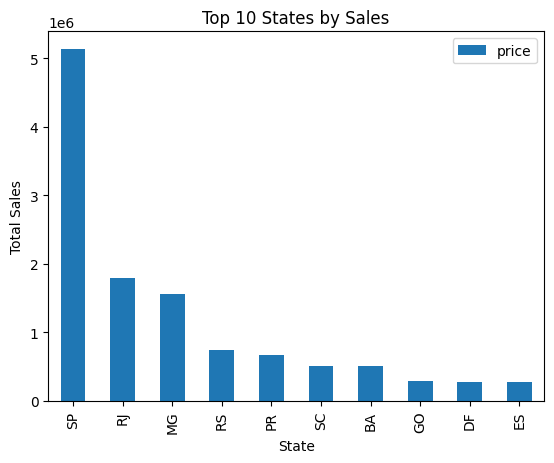

In [ ]:
# prompt: code for sales by top 10  state

# Calculate sales by state
state_sales = rev_products_sales.groupby('customer_state').agg({'price': 'sum'}).sort_values('price', ascending=False)

# Get top 10 states
top_10_states = state_sales.head(10)

# Print the result
print(top_10_states)

# Plot the result
top_10_states.plot(kind='bar')
plt.xlabel('State')
plt.ylabel('Total Sales')
plt.title('Top 10 States by Sales')
plt.show()


In [ ]:
# prompt: based on every thing give me insights that are imp for buisness

# Business Insights from the Analysis

# 1. Geographic Distribution of Sales:
#    - Visualizing sales on a map (like in m_3, m_4, m_5) reveals high-density sales areas.
#    - This helps target marketing efforts, optimize logistics, and potentially identify underserved regions for expansion.
#    - Example: If the Southeast region shows high sales of "Food_and_Beverage", consider localized promotions or partnerships with food delivery services.

# 2. Product Category Performance:
#    - Analyzing sales by category (like the bar chart of top 10 states) identifies top-performing and underperforming categories.
#    - This guides inventory management, pricing strategies, and product development.
#    - Example: "Electric_Appliance" being a top seller in Sao Paulo might warrant increased stock and targeted advertising.

# 3. Customer Spending Behavior:
#    - The TSPC analysis (m_4) helps segment customers based on spending habits.
#    - This allows for tailored loyalty programs, personalized recommendations, and targeted promotions.
#    - Example: High-spending customers could receive exclusive offers or early access to new products.

# 4. Freight Cost Optimization:
#    - Identifying areas with high freight costs (m_5) can lead to cost-saving strategies.
#    - Consider negotiating better rates with carriers, optimizing delivery routes, or exploring regional warehouses.
#    - Example: High freight costs in remote areas might justify offering free shipping for bulk orders to incentivize purchases.

# 5. Data Quality and Further Analysis:
#    - The analysis highlighted data inconsistencies (e.g., missing product categories, split freight values).
#    - Addressing these issues improves the accuracy of insights.
#    - Further analysis could explore seasonality, customer demographics, and product reviews for deeper understanding.

# Note: These are general insights based on the provided code. A more comprehensive analysis with specific business goals would yield more actionable recommendations.
